In [15]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json
from scipy.interpolate import interp1d
from scipy.spatial import ConvexHull
from scipy.signal import savgol_filter
import plotly.express as px
import plotly.io as pio

# pio.renderers.default = "svg"  # comment this line to use interactive plots
import plotly.graph_objects as go
import sys
import logging

logging.basicConfig(stream=sys.stdout, level=logging.DEBUG)

sys.path.append("../components/paddock/")

%load_ext autoreload
%autoreload 2
from telemetry.influx import Influx

from IPython.display import Image

pd.set_option("display.max_columns", None)

influx = Influx()
influx.laps_from_file("tracks.csv")
cc_landmarks = json.loads(open("trackLandmarksData.json").read())["TrackLandmarksData"]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
# (game, session, track, car) = "iRacing,1670222575,pocono 2016,Dallara IR18".split(",")
# (game, session, track, car) = "Automobilista 2,1671635969,Cascavel4:Cascavel2,Mercedes-Benz Actros".split(",")
(game, session, track, car) = "iRacing,1670287161,spielberg gp,Porsche 911 GT3.R".split(",")
# (game, session, track, car) = "iRacing,1670238139,spa up,Mercedes W12".split(",")
all_laps = influx.telemetry_for(game=game, track=track, car=car)
# find the entry where "irTrackName" == track
landmarks = None
for lm in cc_landmarks:
    if "irTrackName" in lm:
        if lm["irTrackName"] == track:
            landmarks = lm
            break

INFO:root:Processing iRacing spielberg gp : 1670287161 -  2 : 4279 - 91.80323
INFO:root:Processing iRacing spielberg gp : 1670287161 -  5 : 4278 - 92.3017
INFO:root:Processing iRacing spielberg gp : 1670287161 -  3 : 4278 - 92.35553
INFO:root:Processing iRacing spielberg gp : 1670287161 -  7 : 4278 - 92.63503
INFO:root:Processing iRacing spielberg gp : 1670287161 -  6 : 4279 - 94.1363
INFO:root:Processing iRacing spielberg gp : 1670287161 -  4 : 4278 - 94.33493


In [25]:
turns = []
for i in range(len(landmarks["trackLandmarks"]) - 1):
    landmark = landmarks["trackLandmarks"][i]
    turn = {
        "name": landmark["landmarkName"],
    }

    if i == 0:
        turn["start"] = 0
    else:
        start = (turns[i - 1]["end"] + landmark["distanceRoundLapStart"]) / 2
        turn["start"] = start
        turns[i - 1]["end"] = start

    turn["end"] = landmark["distanceRoundLapEnd"]
    turns.append(turn)

print(turns)

[{'name': 'turn1', 'start': 0, 'end': 820.0}, {'name': 'turn2', 'start': 820.0, 'end': 1695.0}, {'name': 'turn3', 'start': 1695.0, 'end': 2370.0}, {'name': 'turn4', 'start': 2370.0, 'end': 2780.0}, {'name': 'turn5', 'start': 2780.0, 'end': 3005.0}, {'name': 'turn6', 'start': 3005.0, 'end': 3390.0}, {'name': 'turn7', 'start': 3390.0, 'end': 3730}]


In [32]:
# create one plotly figure
fig = go.Figure()

df = all_laps[4].copy()
df = df[df["Gear"] != 0]
fig.add_scatter(
    x=df["DistanceRoundTrack"],
    y=df["SpeedMs"],
    marker=dict(size=2),
    name=df["id"].iloc[0],
)

for i in range(len(landmarks["trackLandmarks"]) - 1):
    landmark = landmarks["trackLandmarks"][i]
    turn = turns[i]
    start = landmark["distanceRoundLapStart"]
    end = landmark["distanceRoundLapEnd"]
    fig.add_vline(x=start, line_width=2, line_dash="dash", line_color="green")
    fig.add_vline(x=end, line_width=2, line_dash="dash", line_color="red")
    fig.add_vline(x=turn["end"], line_width=2, line_color="yellow")
    segment = df[(df["DistanceRoundTrack"] >= turn["start"]) & (df["DistanceRoundTrack"] <= turn["end"])]
    gear = segment["Gear"].min()
    print(f"{landmark['landmarkName']}: {gear}")

fig.show()

turn1: 2.0
turn2: 1.0
turn3: 1.0
turn4: 3.0
turn5: 3.0
turn6: 3.0
turn7: 4.0


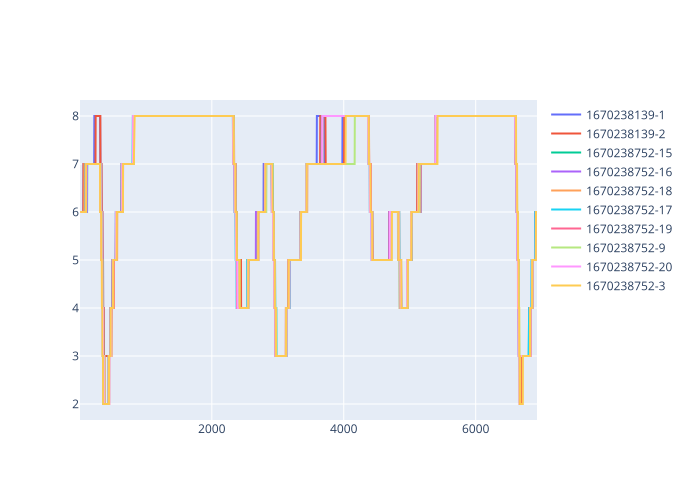

In [4]:
# create one plotly figure
fig = go.Figure()

laps = []
for df in all_laps:
    df = df[df["Gear"] != 0]
    fig.add_scatter(
        x=df["DistanceRoundTrack"],
        y=df["Gear"],
        marker=dict(size=2),
        name=df["id"].iloc[0],
    )
    laps.append(df.copy())
fig.show()

In [5]:
# get the max distance for each lap and select the max
max_distance = np.max([df["DistanceRoundTrack"].max() for df in laps])

display(f"max distance: {max_distance}")

'max distance: 6929.449'

In [6]:
laps = influx.remove_uncorrelated_laps(all_laps, column="Gear", threshold=0.5)

In [7]:
# create one plotly figure
fig = go.Figure()
df = laps[0]
df = df[df["Gear"] != 0]
df = influx.extend_lap(df)

fig.add_scatter(x=df["DistanceRoundTrack"], y=df["Gear"], marker=dict(size=2), name="ref")

all_minima = []
for df in laps:
    # remove all rows where the gear is 0
    df = df[df["Gear"] != 0]
    df = influx.extend_lap(df)

    fig.add_scatter(
        x=df["DistanceRoundTrack"],
        y=df["Gear"],
        mode="markers",
        marker=dict(size=2),
        name=df["id"].iloc[0],
    )
    minima = influx.local_minima(df)
    print(f"number of minima {len(minima)} for lap {df['id'].iloc[0]}")
    all_minima.append(minima)
    fig.add_scatter(
        x=minima["DistanceRoundTrack"],
        y=minima["Gear"],
        mode="markers",
        marker=dict(size=10),
        name=df["id"].iloc[0],
    )
fig.show()

number of minima 40 for lap 1670238139-1
number of minima 46 for lap 1670238139-2
number of minima 42 for lap 1670238752-15
number of minima 42 for lap 1670238752-16
number of minima 40 for lap 1670238752-18
number of minima 39 for lap 1670238752-17
number of minima 40 for lap 1670238752-19
number of minima 40 for lap 1670238752-9
number of minima 36 for lap 1670238752-20
number of minima 45 for lap 1670238752-3


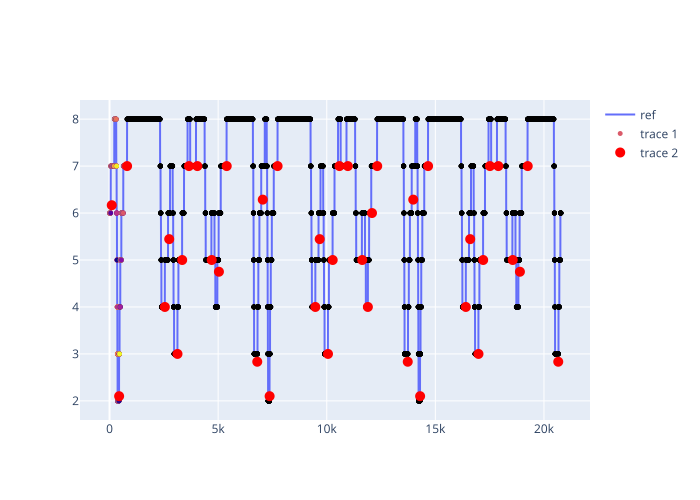

In [8]:
fig = go.Figure()
df = laps[0]
df = df[df["Gear"] != 0]
df = influx.extend_lap(df)

fig.add_scatter(x=df["DistanceRoundTrack"], y=df["Gear"], marker=dict(size=2), name="ref")

centroids_df, labels = influx.cluster(all_minima)

# Plot the laps points with different colors for each cluster the colors are in lables
fig.add_scatter(
    y=df["Gear"],
    x=df["DistanceRoundTrack"],
    mode="markers",
    marker=dict(size=5, color=labels),
)

# Add the centroids to the plot
fig.add_scatter(
    x=centroids_df["DistanceRoundTrack"],
    y=centroids_df["Gear"],
    mode="markers+text",
    marker=dict(size=10, color="red"),
)

In [9]:
# display(centroids_df)
# sort the centroids by DistanceRoundTrack and reset the index
centroids_df = centroids_df.sort_values(by=["DistanceRoundTrack"])
centroids_df = centroids_df.reset_index(drop=True)
df = centroids_df.copy()

length = laps[0]["DistanceRoundTrack"].max()
display(length)

# apply modulo length to DistanceRoundTrack
df["DistanceRoundTrack"] = df["DistanceRoundTrack"].mod(length)
# display(df)

# sort the centroids by DistanceRoundTrack and reset the index
df = df.sort_values(by=["DistanceRoundTrack"])
df = df.reset_index(drop=True)
display(df)

n_clusters = int(len(df) / 3)
turns, labels = influx.cluster([df], field="Gear", n_clusters=n_clusters)
turns = turns.sort_values(by=["DistanceRoundTrack"])
turns = turns.reset_index(drop=True)
display(turns)

6927.998

,Gear,DistanceRoundTrack
0,6.166667,101.922265
1,6.285714,125.343522
2,6.285714,125.958341
3,2.100000,441.651706
4,2.100000,441.940191
5,2.100000,442.228676
6,7.000000,808.640520
7,7.000000,808.929005
8,7.000000,809.217490
9,4.000000,2546.863852


,Gear,DistanceRoundTrack
0,6.246032,117.741376
1,2.100000,441.940191
2,7.000000,808.929005
3,4.000000,2547.152337
4,5.444444,2747.266503
5,3.000000,3129.271665
6,5.000000,3345.746822
7,7.000000,3657.485334
8,7.000000,4043.957440
9,5.000000,4705.482969
